# DEF-D Fysieke Ontwerpopdracht 1 invul template

## Groepsgegevens en planning 

Aan het einde van deze ontwerpopdracht lever je als groep dit notebook gezamenlijk in via een pull request op Github en lever je een link naar dit pull request in op Brightspace. Zet jullie studienummers en namen in onderstaande tabel zodat wij zeker weten dat het groepsvormen goed is gegaan. Werk in de juiste branch.

| Groep: 6     |  |
| :-------------|:-------------|
| Lukas Calixtro| 6528619 |
| Matteo Leonardi| 6391494 |
| Dexter Mourik| 6270433 |

| Planning Groep: 6     |Tijdstip / Tijdspanne  |
|---|---|
| Mijlpaal 1: Criteria opgesteld | 12:00 |
| Mijlpaal 2: Eerste kalibratie meting gedaan| 12:45 |
| Pauze 1| 12:45 - 13:45 |
| Meetopstelling schetsen/bouwen| 13:45 - 15:00 |
| Meten| 15:00 - 16:30 |
| Data analyse| 16:30 - 17:00 |
| Conclusie en notebook afwerken | 17:00 - 17:30 |

## *Opdracht 1*: Foto van alle schetsen.

Zet de foto in dezelfde map als dit notebook en verander hieronder de naam in de naam van de foto.

![Alt](DEF2.jpeg "analyse: ideeen")

## *Opdracht 2*, MIJLPAAL, Leerdoel
Vul onderstaande tabel in en geef aan met welke sensor je verder gaat.** Laat dit aan je TA zien.** Als je TA druk is: ga wel ondertussen door met de volgende stap.

| Sensor | Toepassing | Criteria |
|:---|:---|:---|
|Licht | Als computerscherm uitgaat, dan druk op een knopje om scherm aan te zetten | Kan bij een gemeten waarde 0 - 100 lumens scherm weer aanzetten. |
|Licht |  | Kan de lichtintensiteit meten tussen 100-500 lumens, tot 1 lumens accuraat |
|Licht |  | Kan laatst ingesteld intensiteit opslaan en weer hanteren  |
|Temperatuur | Wanneer koffie te warm is, dan lamp gaat branden | Kan de temperatuur meten tussen 20˚C - 100˚C  |
|Temperatuur |  | Kan meten tot de 0.5 ˚C accuraat meten |
|Temperatuur |  | sensor moet niet smelten bij 100˚C |
|Kracht |  | Sensor moet niet kapot bij 70N - 140N. Sensor moet kracht nog accuraat meten als water op sensor zit.  |
|Kracht |   | De gemeten kracht moet gedurende een tijdsinterval van 2 seconden overschreden worden om af te gaan |
|Kracht | Als branddeur open gaat, dan alarm af   | Kan meten tussen de 50N - 100N om valsalarms te vermijden, tot op 1N accuraat |

Groep 6 heeft gekozen voor kracht sensor. 

## *Opdracht 3*: Foto van de schets van jouw meetopstelling in.
Licht kort toe wat er in de foto te zien is.
 ![Alt](DEF3.jpeg "schets student")

## *Opdracht 4*: Beantwoord de vragen

1. Welke variabelen ga je veranderen? 
Hoeveelheid gewicht wat op sensor wordt geplaatst.
2. Over welk bereik ga je deze variabelen veranderen? 
Geen gewicht op sensor - 100N, of dichtbij mogelijk, aan massa op sensor.
3. Wat ga je allemaal meten? 
Massa wat op de sensor ligt en de bijbehorende volt. 
4. Hoeveel metingen ga je doen? 
2 meteningen voor onder- en bovendrempel waarden. En meer metingen tussendoor in gelijke stapgroottes. Per gewicht 3 metingen.
5. Ga je met deze keuzes kunnen evalueren of jouw sensor geschikt is voor de gekozen toepassingen? 
Ja. 


## *Opdracht 5*: Foto van jouw meetopstelling in. Leerdoel.
De krachten sensor aangesloten aan onze arduino.
De sensor is plat aan het rand van de tafel gelegd. Een kraanweegschaal is gebruikt zodat alleen het puntje van de haak op de sensor ligt en zoveelmogelijk van het gewicht de sensor indeukt. Alle gewichten worden aan de onderkant van de kraanweegschaal gehangen.
 ![Alt](DEF.jpeg "meetopstelling student")


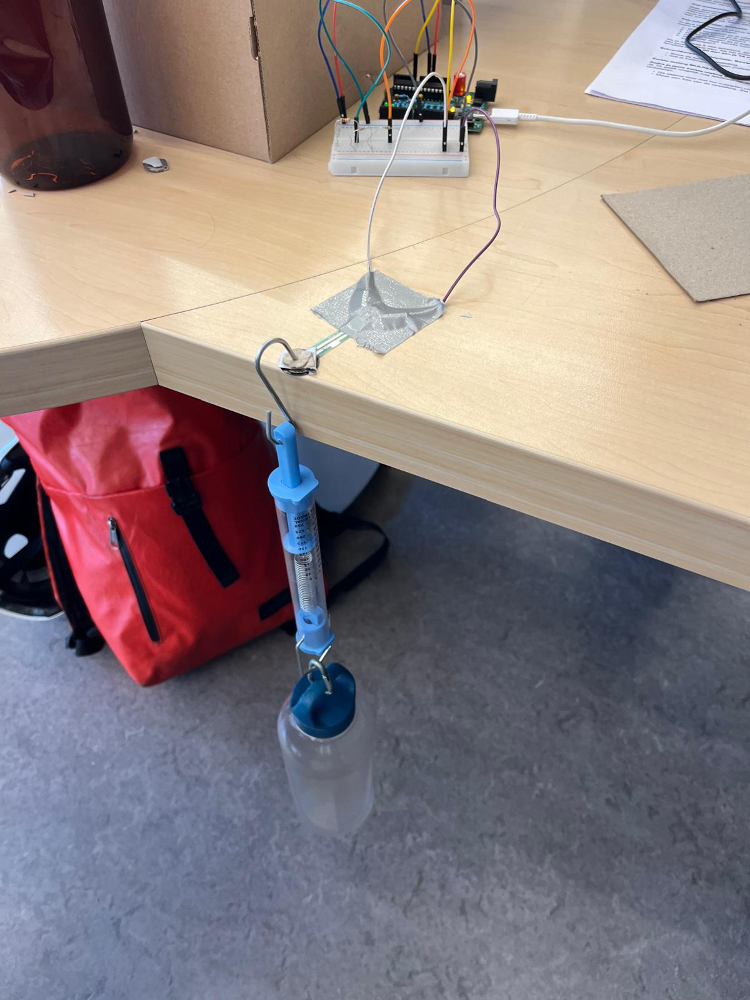

In [1]:
from IPython.display import Image, display
from PIL import Image

img3 = Image.open("DEF4.jpeg")
display(img3)

## *Opdracht 6*: Meten en fitten, Leerdoel

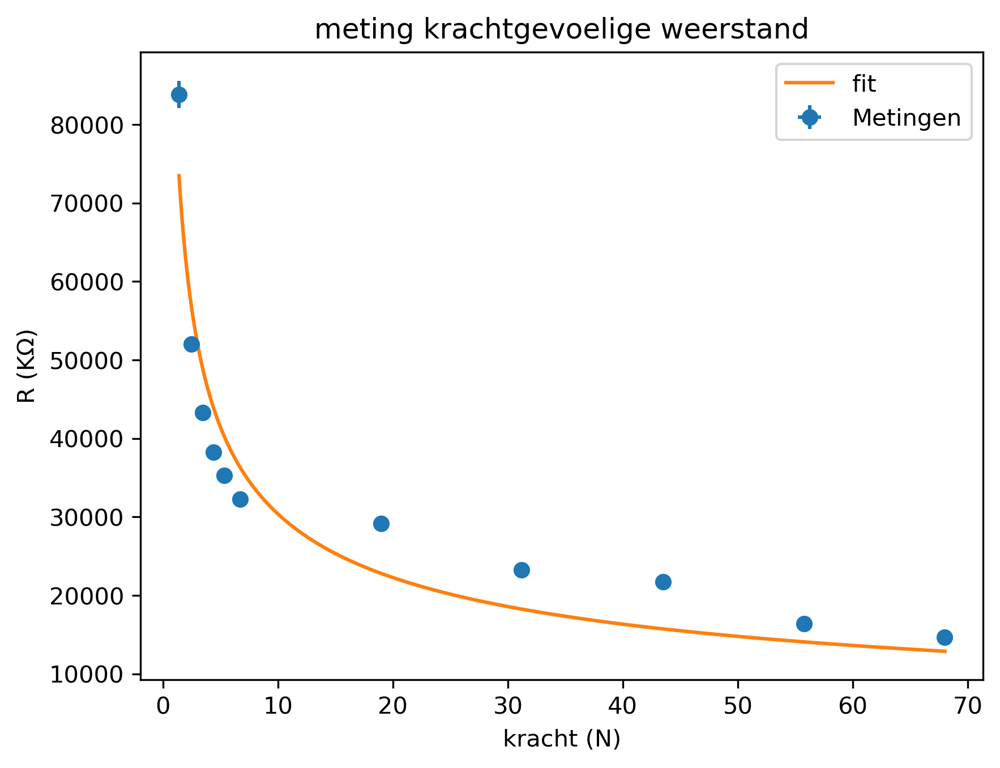

de onzekerheid is [6.76099e+03 5.00000e-02]


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

R_ref = 10 * 10**3. # Kohm
V_in = 5  # volt
arduinomax = 1023

gewichten = np.array([0.1415, 0.2502, 0.3534, 0.4472, 0.5401, 0.6831, 1.9331, 3.1813, 4.4331, 5.6831, 6.9331])*9.81  # kilogram
metingen = np.array([109, 165, 192, 212, 226, 242, 261, 308, 322, 388, 415]) * (5/arduinomax)  # volt
metingen_u = 2 * (5/arduinomax)  # volt
gewichten_u = 0.001 * 9.81  # kg

%matplotlib inline

def R_meting(V_meting):
    global R_ref, V_in
    return (V_in * R_ref)/V_meting - R_ref

def R_u(V_meting, metingen_u):
    global V_in, R_ref
    return (V_in * R_ref / V_meting**2) * metingen_u

def fitfunc(x, a, b):
    return a*x**b

opt, cov = curve_fit(fitfunc, gewichten, R_meting(metingen))



plt.figure(dpi=300)
plt.title('meting krachtgevoelige weerstand')
plt.errorbar(gewichten, R_meting(metingen), fmt='o', yerr=R_u(metingen, metingen_u), xerr=gewichten_u, label="Metingen")
plt.plot(np.linspace(np.min(gewichten), np.max(gewichten), 1000), fitfunc(np.linspace(np.min(gewichten), np.max(gewichten), 1000), *opt), label='fit' )
plt.ylabel(r"R (K$\Omega$)")
plt.xlabel('kracht (N)')
plt.legend()
plt.show()

print('de onzekerheid is', np.round(np.sqrt(np.diag(cov)),2))


## *Opdracht 7*: Iteratie nodig?

We hebben het circuit gaande weg aangepast en andere weerstanden gebruikt om een bereik te hebben die te realiseren is met deze opstelling.
Het originele meet idee was om een gewicht op de sensor te balanseren. Daarna hebben we besloten om de sensor op de rand van de tafel te plakken en met een haak een gewicht eraan te hangen, zodat de massa niet deels op de tafel gewicht uitoefent.
Het gewicht aanpassen werd eerst met flessen gevuld met water gedaan, daarna hebben wij gewichtplaten aan de haat gezet om een grotere massabereik te bereiken.

## *Opdracht 8*: Conclusie, leerdoel

De weerstand en kracht hebben een inverse exponentiele verband. Dus bij grotere krachten wordt de weerstand ongeveeer hetzelfde. In ons grafiek is dat ook te zien, dus onze metingen nemen het juist verband aan. Maar de sensor voldoet niet aan de criteria dat het tot de 1N accuraat moest kunnen meten. Op de grafiek vallen alle meetwaardes te ver weg van de fit. De kleine onzekerheid in onze metingen komt omdat de meetprocedure met onze meetopstelling heel goed is gelukt. De drempelwaarde voor onze sensor was groot, dus de sensor is hiervoor niet geschikt.

## *Opdracht 9*: Aantonen leerdoelen beheersing

Om aan te tonen dat je de leerdoelen beheerst, kopieer je hieronder alle cellen met 'leerdoel' in de titel. Zet zelf de cellen onder de goede kopjes. Mogelijk komt een cel bij meerdere leerdoelen terug.

### Leerdoel 1: Simpele circuits (RC-circuit, spanningsdelers met sensoren) ontwerpen en fabriceren.

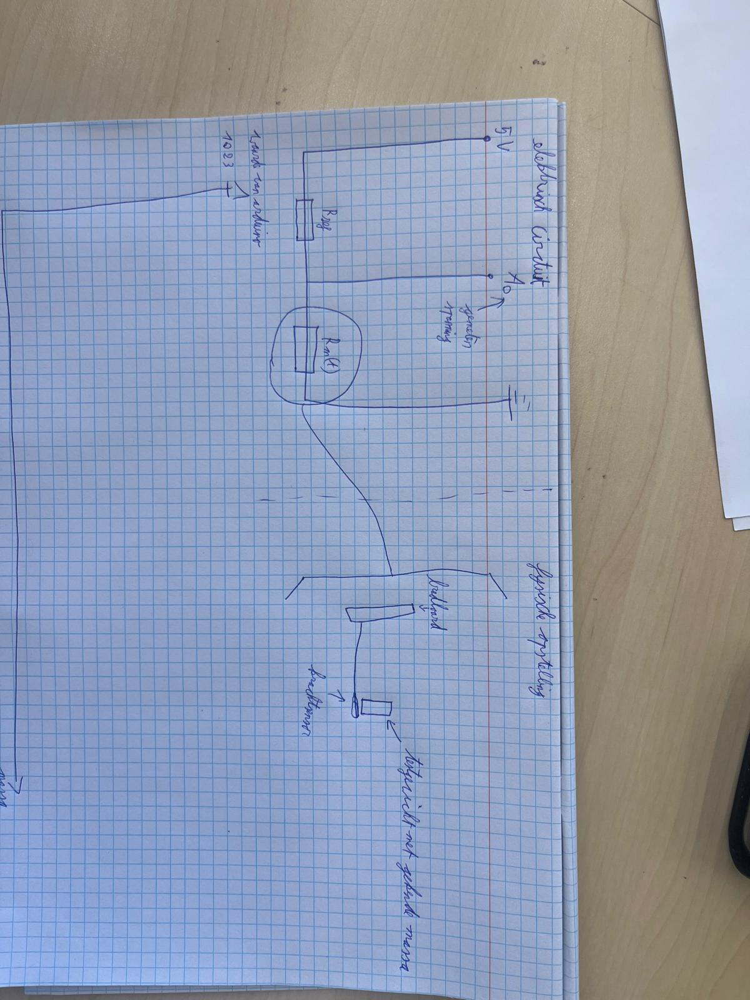

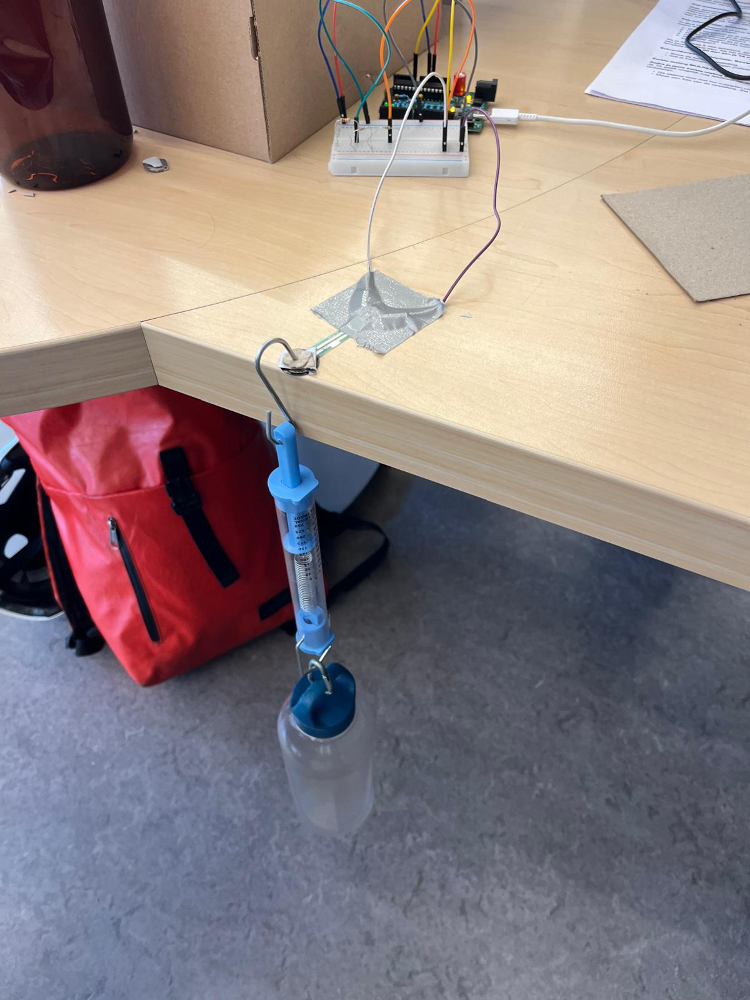

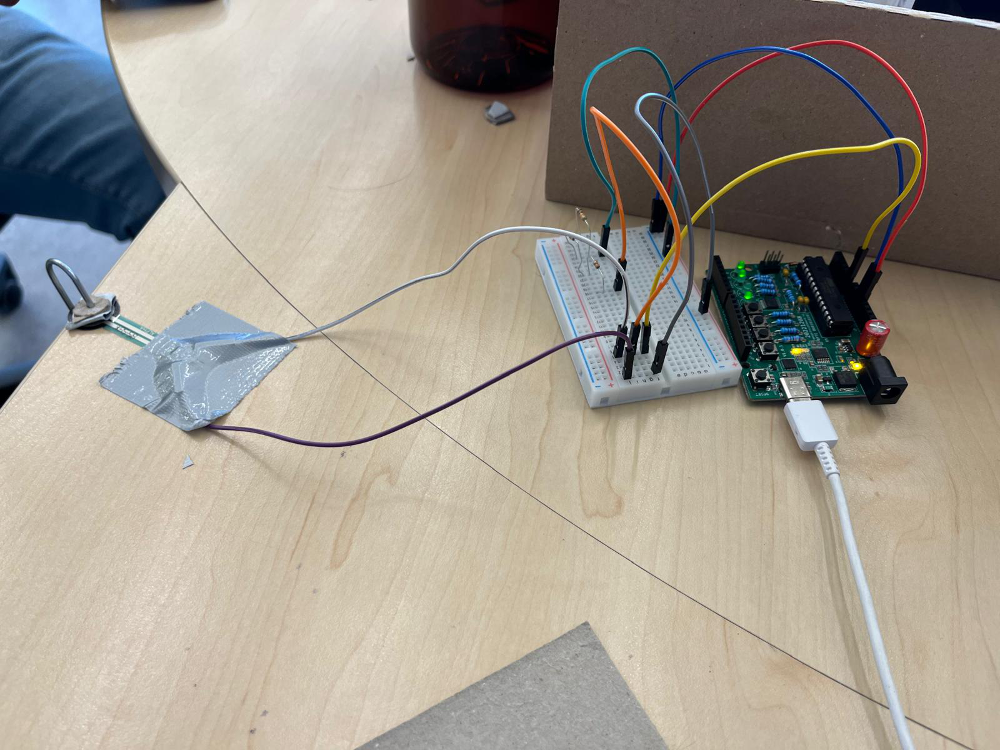

In [3]:
img2 = Image.open("DEF3.jpeg")
display(img2)

img3 = Image.open("DEF4.jpeg")
img4 = Image.open("DEF.jpeg")
display(img3)
display(img4)

### Leerdoel 2: Ontwerpeisen voor een opdracht SMART opstellen en vervolgens de ontwerpcyclus inrichten, rekening houdend met de randvoorwaarde van de opdracht.

| Sensor | Toepassing | Criteria |
|:---|:---|:---|
|Licht | Als computerscherm uitgaat, dan druk op een knopje om scherm aan te zetten | Kan bij een gemeten waarde 0 - 100 lumens scherm weer aanzetten. |
|Licht |  | Kan de lichtintensiteit meten tussen 100-500 lumens, tot 1 lumens accuraat |
|Licht |  | Kan laatst ingesteld intensiteit opslaan en weer hanteren  |
|Temperatuur | Wanneer koffie te warm is, dan lamp gaat branden | Kan de temperatuur meten tussen 20˚C - 100˚C  |
|Temperatuur |  | Kan meten tot de 0.5 ˚C accuraat meten |
|Temperatuur |  | sensor moet niet smelten bij 100˚C |
|Kracht |  | Sensor moet niet kapot bij 70N - 140N. Sensor moet kracht nog accuraat meten als water op sensor zit.  |
|Kracht |   | De gemeten kracht moet gedurende een tijdsinterval van 2 seconden overschreden worden om af te gaan |
|Kracht | Als branddeur open gaat, dan alarm af   | Kan meten tussen de 50N - 100N om valsalarms te vermijden, tot op 1N accuraat |

### Leerdoel 3: Voor een gegeven sensor & analoog-digitaal convertor en gegeven (of zelf gekozen) toepassing een kalibratie meting ontwerpen, inclusief het circuit om de sensor aan te sluiten op de analoog-digitaal convertor, de opstelling bouwen, en meetresultaten verwerken en concluderen of de combinatie van sensor en analoog-digitaal conversie geschikt is voor de toepassing.

De weerstand en kracht hebben een inverse exponentiele verband. Dus bij grotere krachten wordt de weerstand ongeveeer hetzelfde. In ons grafiek is dat ook te zien, dus onze metingen nemen het juist verband aan. Maar de sensor voldoet niet aan de criteria dat het tot de 1N accuraat moest kunnen meten. Op de grafiek vallen alle meetwaardes te ver weg van de fit. De kleine onzekerheid in onze metingen komt omdat de meetprocedure met onze meetopstelling heel goed is gelukt. De drempelwaarde voor onze sensor was groot, dus de sensor is hiervoor niet geschikt.

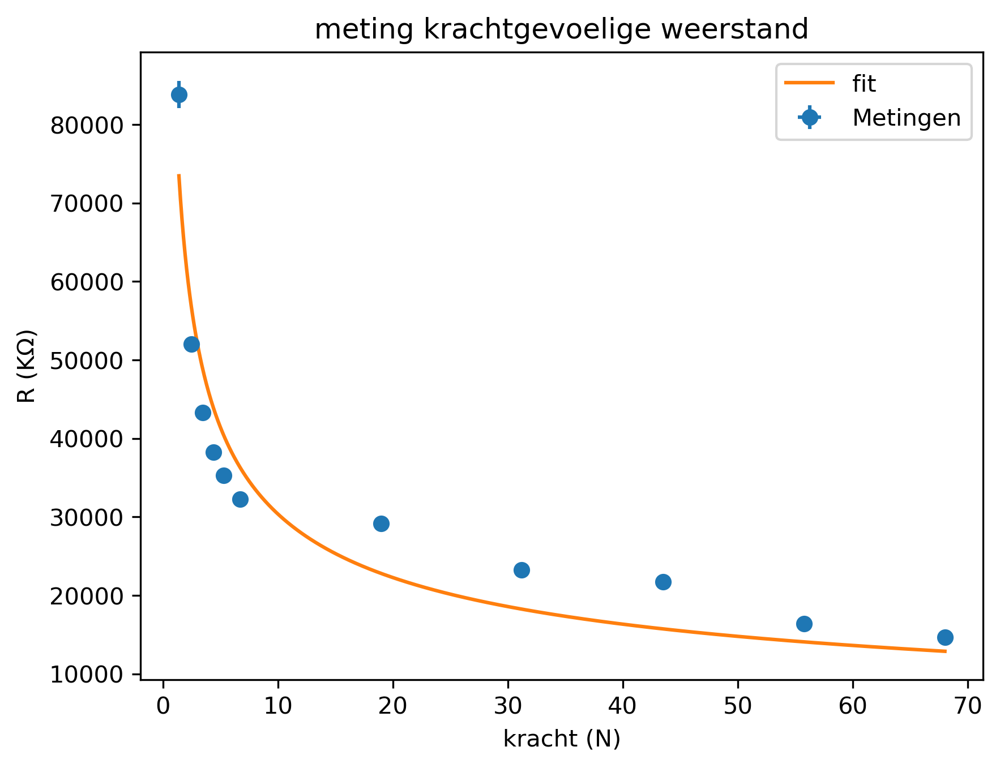

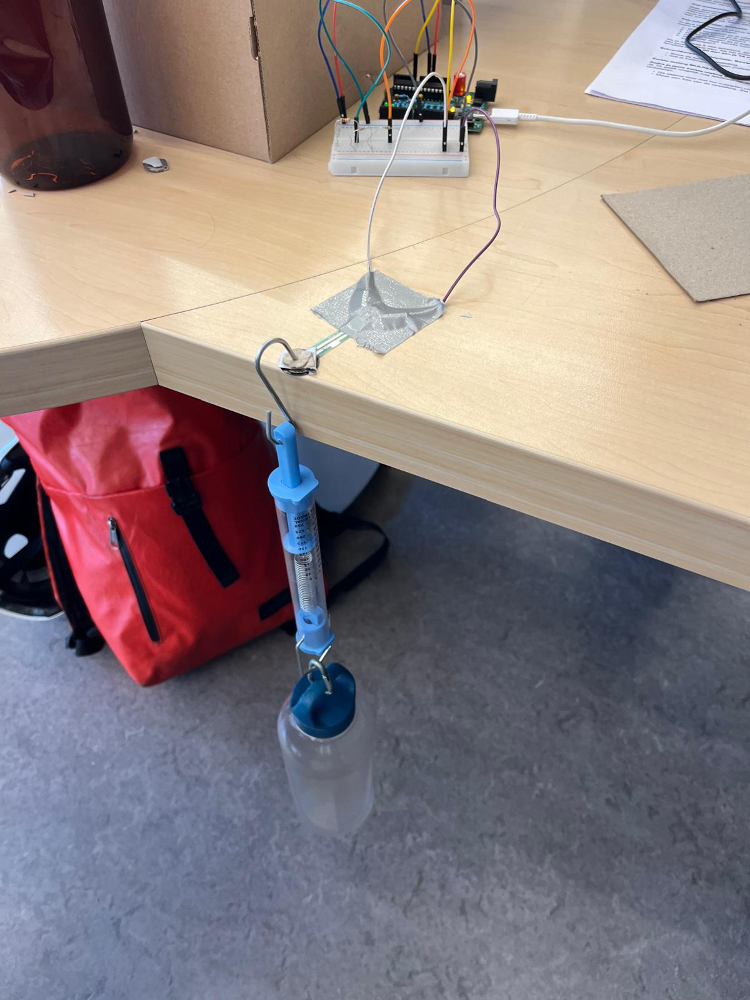

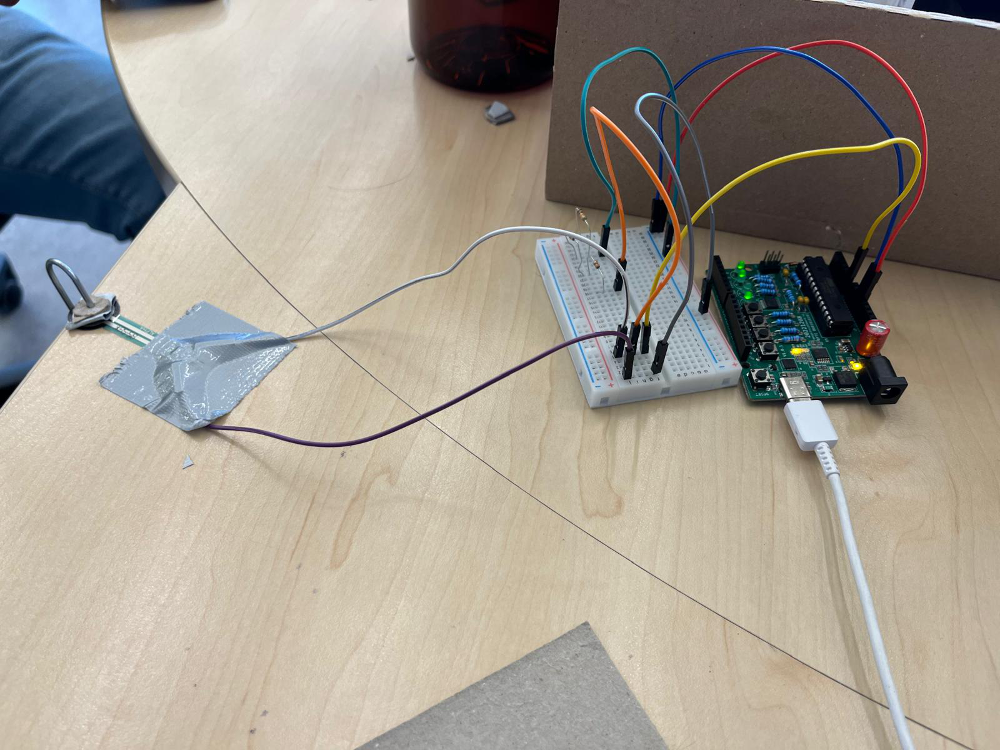

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

R_ref = 10 * 10**3. # Kohm
V_in = 5  # volt
arduinomax = 1023

gewichten = np.array([0.1415, 0.2502, 0.3534, 0.4472, 0.5401, 0.6831, 1.9331, 3.1813, 4.4331, 5.6831, 6.9331])*9.81  # kilogram
metingen = np.array([109, 165, 192, 212, 226, 242, 261, 308, 322, 388, 415]) * (5/arduinomax)  # volt
metingen_u = 2 * (5/arduinomax)  # volt
gewichten_u = 0.001  # kg

%matplotlib inline

def R_meting(V_meting):
    global R_ref, V_in
    return (V_in * R_ref)/V_meting - R_ref

def R_u(V_meting, metingen_u):
    global V_in, R_ref
    return (V_in * R_ref / V_meting**2) * metingen_u

def fitfunc(x, a, b):
    return a*x**b

opt, cov = curve_fit(fitfunc, gewichten, R_meting(metingen))



plt.figure(dpi=300)
plt.title('meting krachtgevoelige weerstand')
plt.errorbar(gewichten, R_meting(metingen), fmt='o', yerr=R_u(metingen, metingen_u), xerr=gewichten_u, label="Metingen")
plt.plot(np.linspace(np.min(gewichten), np.max(gewichten), 1000), fitfunc(np.linspace(np.min(gewichten), np.max(gewichten), 1000), *opt), label='fit' )
plt.ylabel(r"R (K$\Omega$)")
plt.xlabel('kracht (N)')
plt.legend()
plt.show()


img3 = Image.open("DEF4.jpeg")
img4 = Image.open("DEF.jpeg")
display(img3)
display(img4)
